In [8]:
import numpy as np 
import pandas as pd 
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob 
import folium
from folium.plugins import HeatMap
import re
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
# Initialize VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()



[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/repl/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [4]:
df = pd.read_csv('nikelululemonadidas_tweets.csv')
df.head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status,withheld_in_countries
0,Fri Oct 01 08:25:03 +0000 2021,1443854459625431000,1443854459625431041,#ad The Nike Women's Air More Uptempo 96 'Whit...,False,"[0, 146]","{'hashtags': [{'text': 'ad', 'indices': [0, 3]...","{'media': [{'id': 1443854458404941800, 'id_str...","<a href=""https://www.hootsuite.com"" rel=""nofol...",NaN,NaN,NaN,NaN,NaN,"{'id': 792182745942233100, 'id_str': '79218274...",NaN,NaN,NaN,NaN,False,2,3,False,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1,Fri Oct 01 07:37:16 +0000 2021,1443842433641558000,1443842433641558039,@_christiankeith @d1vetsam @KicksFinder They a...,False,"[40, 73]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",1.443836e+18,1.443836e+18,342395526.0,342395526.0,_christiankeith,"{'id': 723347581586255900, 'id_str': '72334758...",NaN,NaN,NaN,NaN,False,0,0,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN
2,Fri Oct 01 10:01:58 +0000 2021,1443878848211439600,1443878848211439632,Proof @LaserShip is stealing. I work from home...,False,"[0, 106]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1443878844923105300, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,NaN,"{'id': 25992197, 'id_str': '25992197', 'name':...",NaN,NaN,NaN,NaN,False,0,2,False,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
3,Fri Oct 01 07:41:45 +0000 2021,1443843563108905000,1443843563108904965,RT @pyleaks: *LEAK ALERT*: The next Supreme x ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/android"" ...",NaN,NaN,NaN,NaN,NaN,"{'id': 387768448, 'id_str': '387768448', 'name...",NaN,NaN,NaN,NaN,False,17,0,False,False,NaN,en,{'created_at': 'Wed Sep 29 15:40:11 +0000 2021...,NaN,NaN,NaN,NaN,NaN
4,Fri Oct 01 06:22:08 +0000 2021,1443823529296867300,1443823529296867350,RT @SneakerScouts: #ad The Space Jam x Nike Le...,False,"[0, 140]","{'hashtags': [{'text': 'ad', 'indices': [19, 2...",NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,NaN,NaN,NaN,NaN,"{'id': 792182745942233100, 'id_str': '79218274...",NaN,NaN,NaN,NaN,False,3,0,False,False,NaN,en,{'created_at': 'Thu Sep 30 16:10:08 +0000 2021...,NaN,NaN,NaN,NaN,NaN


In [55]:
df.columns

Index(['created_at', 'id', 'id_str', 'full_text', 'truncated',
       'display_text_range', 'entities', 'extended_entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
       'retweeted_status', 'quoted_status_id', 'quoted_status_id_str',
       'quoted_status_permalink', 'quoted_status', 'withheld_in_countries'],
      dtype='object')

In [22]:
df.shape

(175078, 32)

In [23]:
df['created_at']

0         Fri Oct 01 08:25:03 +0000 2021
1         Fri Oct 01 07:37:16 +0000 2021
2         Fri Oct 01 10:01:58 +0000 2021
3         Fri Oct 01 07:41:45 +0000 2021
4         Fri Oct 01 06:22:08 +0000 2021
                       ...              
175073    Sat Jan 01 06:20:03 +0000 2022
175074    Sat Jan 01 06:42:24 +0000 2022
175075    Sat Jan 01 06:21:54 +0000 2022
175076    Sat Jan 01 06:32:35 +0000 2022
175077    Sat Jan 01 06:17:59 +0000 2022
Name: created_at, Length: 175078, dtype: object

In [24]:
search_words = ["colin", "kaepernick", "colin kaepernick", "Colin Kaepernick"]

# Create a mask for rows containing any of the search words in any column
mask = df.apply(lambda row: row.astype(str).str.contains('|'.join(search_words), case=False, na=False).any(), axis=1)

# Filter the DataFrame using the mask
filtered_df = df[mask]

# Display the filtered DataFrame
filtered_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status,withheld_in_countries
618,Fri Oct 01 20:23:41 +0000 2021,1444035309348343800,1444035309348343808,@TonyG75672829 @NBCBLK @FoxNews @NationalActio...,False,"[69, 338]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/android"" ...",1.444035e+18,1.444035e+18,1.275141e+18,1.275141e+18,TonyG75672829,"{'id': 326853707, 'id_str': '326853707', 'name...",NaN,NaN,NaN,NaN,False,0,0,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN
803,Fri Oct 01 23:21:52 +0000 2021,1444080149889171500,1444080149889171458,I’m old enough to remember when Trump and all ...,False,"[0, 166]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1444080143283204000, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,NaN,"{'id': 2260944469, 'id_str': '2260944469', 'na...",NaN,NaN,NaN,NaN,False,0,1,False,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1603,Sat Oct 02 18:16:17 +0000 2021,1444365635845169200,1444365635845169152,This is all on you @KingJames @Kaepernick7 @Ni...,False,"[0, 72]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,NaN,"{'id': 67397666, 'id_str': '67397666', 'name':...",NaN,NaN,NaN,NaN,True,0,1,False,False,False,en,NaN,1.444057e+18,1.444057e+18,"{'url': 'https://t.co/r8jQdEAtzp', 'expanded':...",{'created_at': 'Fri Oct 01 21:47:55 +0000 2021...,NaN
3062,Mon Oct 04 14:07:05 +0000 2021,1445027697818755000,1445027697818755072,@NoToChina_org @Nike I don’t think it did that...,False,"[21, 242]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",1.429297e+18,1.429297e+18,1.410914e+18,1.410914e+18,NoToChina_org,"{'id': 26800438, 'id_str': '26800438', 'name':...",NaN,NaN,NaN,NaN,False,0,0,False,False,True,en,NaN,NaN,NaN,NaN,NaN,NaN
3876,Mon Oct 04 22:45:16 +0000 2021,1445158104274903000,1445158104274903044,@NFL @Twitter Wouldn’t know. #BoycottNFL year ...,False,"[14, 194]","{'hashtags': [{'text': 'BoycottNFL', 'indices'...","{'media': [{'id': 1445158100193841200, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",1.445104e+18,1.445104e+18,1.942655e+07,1.942655e+07,NFL,"{'id': 383006915, 'id_str': '383006915', 'name...",NaN,NaN,NaN,NaN,False,0,1,False,False,True,en,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174357,Fri Dec 31 19:06:10 +0000 2021,1476993096877551600,1476993096877551617,@TheBabylonBee @Kaepernick7 @NFL @Nike @nikefo...,False,"[0, 52]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1476993095556386800, 'id_str...","<a href=""http://twitter.com/download/android"" ...",NaN,NaN,4.914384e+09,4.914384e+09,TheBabylonBee,"{'id': 1461513755838365700, 'id_str': '1461513...",NaN,NaN,NaN,NaN,False,0,1,False,False,False,und,NaN,NaN,NaN,NaN,NaN,NaN
174697,Fri Dec 31 22:50:17 +0000 2021,1477049499642208300,1477049499642208257,@dsleyton @KSTiLLS @untilfreedom @WNEMTV5news ...,False,"[526, 817]","{'hashtags': [{'text': 'HBCU', 'indices': [551...","{'media': [{'id': 1477049492218200000, 'id_str...","<a href=""http://twitter.com/download/android"" ...",1.475482e+18,1.475482e+18,2.867675e+09,2.867675e+09,Area72ENT,"{'id': 2867674599, 'id_str': '2867674599', 'na...",NaN,NaN,"{'id': '0022acf0052352cf', 'url': 'https://api...",NaN,True,6,6,False,False,False,en,NaN,1.474954e+18,1.474954e+18,"{'url': 'https://t.co/FSIq8Ndzbo', 'expanded':...",{'created_at': 'Sun Dec 26 04:03:

Tweets that menion 'Colin Kaepernick' and have a positive sentiment.

In [25]:
# Initialize VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Filter tweets mentioning Colin Kaepernick
kaepernick_tweets = df[df['full_text'].str.contains("Colin Kaepernick", flags=re.IGNORECASE, na=False)]

# Apply sentiment analysis to these tweets
kaepernick_tweets['sentiment'] = kaepernick_tweets['full_text'].apply(lambda x: sia.polarity_scores(x)['compound'])

# Filter only positive tweets
positive_tweets = kaepernick_tweets[kaepernick_tweets['sentiment'] > 0]

positive_tweets

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status,withheld_in_countries,sentiment
45531,Mon Oct 25 19:09:15 +0000 2021,1452713887145549800,1452713887145549827,Enes Kanter is the actual brave hero that the ...,False,"[0, 100]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,NaN,"{'id': 216551796, 'id_str': '216551796', 'name...",NaN,NaN,NaN,NaN,True,0,6,False,False,False,en,NaN,1.452712e+18,1.452712e+18,"{'url': 'https://t.co/f6edjUWAbo', 'expanded':...",{'created_at': 'Mon Oct 25 19:02:11 +0000 2021...,NaN,0.4939
51017,Tue Oct 26 18:08:05 +0000 2021,1453060884025118700,1453060884025118722,@EnesKanter @Nike @KingJames @Jumpman23 This d...,False,"[40, 135]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",1.453059e+18,1.453059e+18,302111485.0,302111485.0,EnesFreedom,"{'id': 33426785, 'id_str': '33426785', 'name':...",NaN,NaN,NaN,NaN,False,0,4,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN,0.6858
67051,Fri Oct 29 18:47:34 +0000 2021,1454157981617049600,1454157981617049603,@LaurelAynne 1)Marketing can help start conver...,False,"[13, 264]","{'hashtags': [{'text': 'ICMKTG', 'indices': [2...",NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.452621e+18,1.452621e+18,58807639.0,58807639.0,LaurelAynne,"{'id': 1063658774, 'id_str': '1063658774', 'na...",NaN,NaN,NaN,NaN,False,0,1,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN,0.7901
70407,Mon Nov 01 02:01:03 +0000 2021,1454991849374945300,1454991849374945280,@RickStrom You mean like Colin Kaepernick lame...,False,"[11, 224]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/android"" ...",1.453768e+18,1.453768e+18,323385873.0,323385873.0,RickStrom,"{'id': 517295675, 'id_str': '517295675', 'name...",NaN,NaN,NaN,NaN,False,0,2,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN,0.7500
121840,Thu Dec 02 22:33:46 +0000 2021,1466536096280416300,1466536096280416256,@Nike I see a lot of “slave labor” talk but ho...,False,"[6, 161]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",1.438964e+18,1.438964e+18,415859364.0,415859364.0,Nike,"{'id': 250427357, 'id_str': '250427357', 'name...",NaN,NaN,"{'id': '20ba6fb3b1ee82da', 'url': 'https://api...",NaN,False,0,0,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN,NaN,0.3919


In [46]:
# Filter tweets mentioning "Colin," "Kaepernick," or "Colin Kaepernick"
kaepernick_tweets = df[df['full_text'].str.contains(r'\b(Colin|Kaepernick|Colin Kaepernick)\b', flags=re.IGNORECASE, na=False)]

# Display the first few filtered tweets
print(kaepernick_tweets[['created_at', 'full_text']].head())

                           created_at                                          full_text
618    Fri Oct 01 20:23:41 +0000 2021  @TonyG75672829 @NBCBLK @FoxNews @NationalActio...
803    Fri Oct 01 23:21:52 +0000 2021  I’m old enough to remember when Trump and all ...
5162   Wed Oct 06 00:06:08 +0000 2021  @BurnYourCape @Nike I can’t tell the differenc...
11236  Sat Oct 09 16:54:43 +0000 2021  @stelenj @RonFilipkowski Disgusting, low class...
12775  Mon Oct 11 12:52:26 +0000 2021  @TheodoreG1414 @CAnders06788165 @Nike Putting ...


In [47]:
# Apply VADER sentiment analysis on the filtered tweets
kaepernick_tweets['sentiment'] = kaepernick_tweets['full_text'].apply(lambda text: sia.polarity_scores(text)['compound'])

# Display the tweets with their sentiment scores
print(kaepernick_tweets[['created_at', 'full_text', 'sentiment']].head())

                           created_at  ... sentiment
618    Fri Oct 01 20:23:41 +0000 2021  ...   -0.9174
803    Fri Oct 01 23:21:52 +0000 2021  ...    0.6124
5162   Wed Oct 06 00:06:08 +0000 2021  ...   -0.9912
11236  Sat Oct 09 16:54:43 +0000 2021  ...   -0.7059
12775  Mon Oct 11 12:52:26 +0000 2021  ...    0.5859

[5 rows x 3 columns]


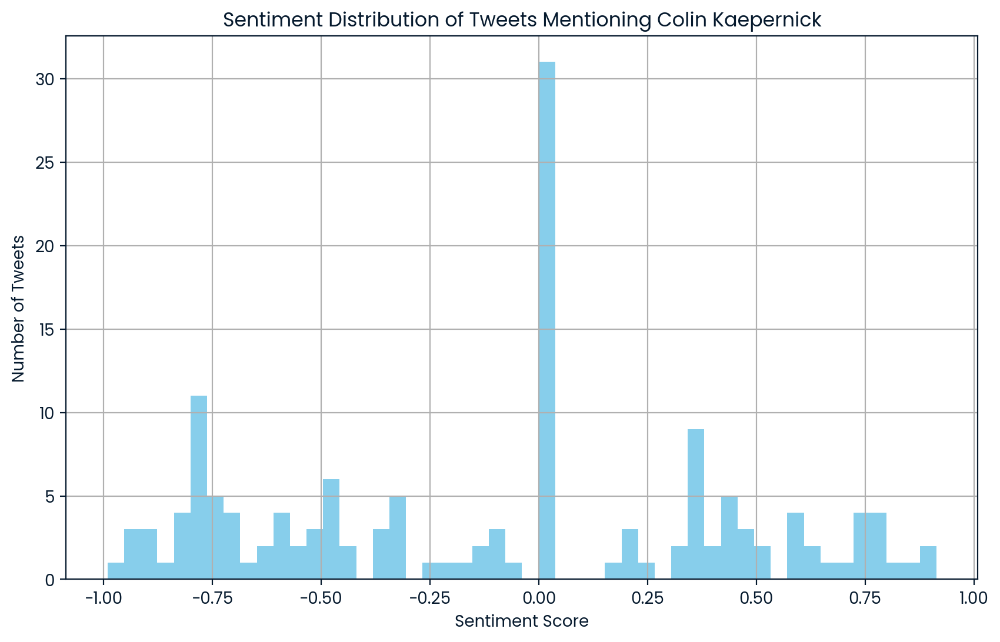

In [48]:
# Plot the sentiment distribution
plt.figure(figsize=(10, 6))
kaepernick_tweets['sentiment'].hist(bins=50, color='skyblue')
plt.title('Sentiment Distribution of Tweets Mentioning Colin Kaepernick')
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Tweets')
plt.show()

In [49]:
# Filter tweets mentioning "Colin," "Kaepernick," or "Colin Kaepernick"
kaepernick_tweets = df[df['full_text'].str.contains(r'\b(Colin|Kaepernick|Colin Kaepernick)\b', flags=re.IGNORECASE, na=False)]

# Apply VADER sentiment analysis
kaepernick_tweets['sentiment'] = kaepernick_tweets['full_text'].apply(lambda text: sia.polarity_scores(text)['compound'])

# Display the first few filtered tweets with sentiment scores
print(kaepernick_tweets[['created_at', 'full_text', 'sentiment']].head())

                           created_at  ... sentiment
618    Fri Oct 01 20:23:41 +0000 2021  ...   -0.9174
803    Fri Oct 01 23:21:52 +0000 2021  ...    0.6124
5162   Wed Oct 06 00:06:08 +0000 2021  ...   -0.9912
11236  Sat Oct 09 16:54:43 +0000 2021  ...   -0.7059
12775  Mon Oct 11 12:52:26 +0000 2021  ...    0.5859

[5 rows x 3 columns]


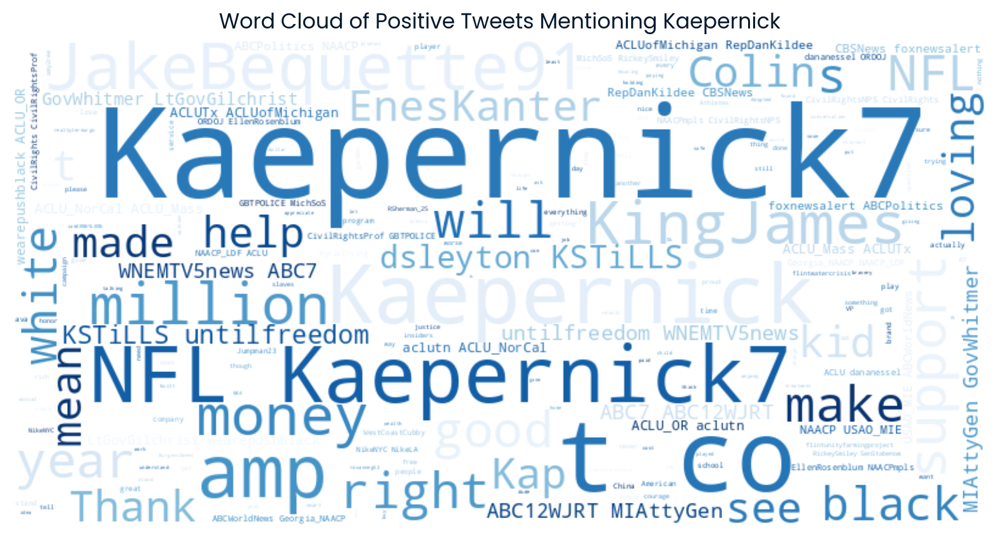

In [14]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Initialize VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Filter tweets mentioning "Kaepernick"
kaepernick_tweets = df[df['full_text'].str.contains("Kaepernick", flags=re.IGNORECASE, na=False)]

# Apply sentiment analysis to these tweets
kaepernick_tweets['sentiment'] = kaepernick_tweets['full_text'].apply(lambda x: sia.polarity_scores(x)['compound'])

# Filter for only positive tweets
positive_tweets = kaepernick_tweets[kaepernick_tweets['sentiment'] > 0.5]  # You can adjust the threshold if needed

# Combine all positive tweets into a single string
positive_text = ' '.join(positive_tweets['full_text'])

# Define words to exclude from the word cloud
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(["nike", "https", "slave", "labor", "netflix"])

# Generate word cloud focusing on positive words
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=custom_stopwords, colormap='Blues').generate(positive_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Word Cloud of Positive Tweets Mentioning Kaepernick")
plt.show()


In [16]:
# list of celebrity names 
celebrities = ["LeBron James", "Serena Williams", "Colin Kaepernick", "Kobe Bryant", "Cristiano Ronaldo", "Michael Jordan", "Kanye West", "Lionel Messi", "David Beckham"]

# Convert the list to lowercase for case-insensitive matching
celebrities = [name.lower() for name in celebrities]

# Initialize a counter
celebrity_mentions = {}

# Check for mentions of each celebrity in the tweets
for celeb in celebrities:
    mentions = df['full_text'].str.contains(celeb, flags=re.IGNORECASE, na=False).sum()
    if mentions > 0:
        celebrity_mentions[celeb] = mentions

# Convert the results to a DataFrame for easier viewing
celebrity_mentions_df = pd.DataFrame(list(celebrity_mentions.items()), columns=['Celebrity', 'Mentions'])

# Display the number of celebrities mentioned and the DataFrame
num_celebrities_mentioned = len(celebrity_mentions_df)
print(f"Number of celebrities mentioned: {num_celebrities_mentioned}")
celebrity_mentions_df

Number of celebrities mentioned: 9


,Celebrity,Mentions
0,lebron james,1006
1,serena williams,7
2,colin kaepernick,25
3,kobe bryant,15
4,cristiano ronaldo,1
5,michael jordan,689
6,kanye west,23
7,lionel messi,41
8,david beckham,1


Text(0, 0.5, 'Celebrity')

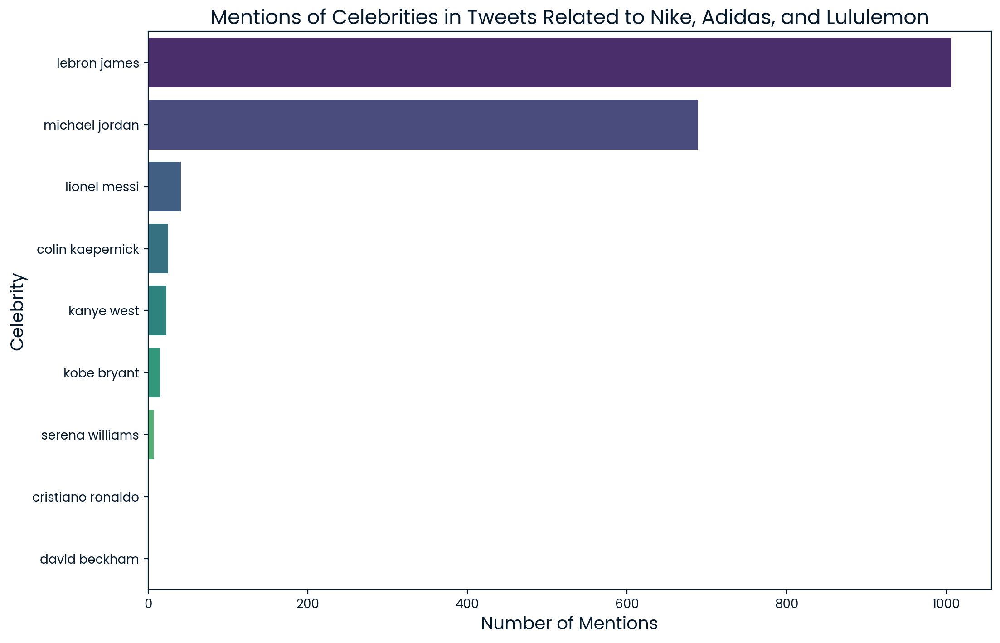

In [19]:
# Sort the DataFrame by the number of mentions
celebrity_mentions_df = celebrity_mentions_df.sort_values(by='Mentions', ascending=False)

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Create the barplot
sns.barplot(x='Mentions', y='Celebrity', data=celebrity_mentions_df, palette='viridis')

# Add titles and labels
plt.title('Mentions of Celebrities in Tweets Related to Nike, Adidas, and Lululemon', fontsize=16)
plt.xlabel('Number of Mentions', fontsize=14)
plt.ylabel('Celebrity', fontsize=14)

# Display the plot